Problem statement: To build a CNN based model which can accurately detect melanoma. Melanoma is a type of cancer that can be deadly if not detected early. It accounts for 75% of skin cancer deaths. A solution which can evaluate images and alert the dermatologists about the presence of melanoma has the potential to reduce a lot of manual effort needed in diagnosis.

### Importing all the important libraries

In [1]:
import pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
# using the data by mounting the google drive, use the following :
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


This assignment uses a dataset of about 2357 images of skin cancer types. The dataset contains 9 sub-directories in each train and test subdirectories. The 9 sub-directories contains the images of 9 skin cancer types respectively.

# **Data Reading/Data Understanding** → Defining the path for train and test images

In [3]:
# Defining the path for train and test images
## Todo: Update the paths of the train and test dataset
data_dir_train = pathlib.Path("/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train")
data_dir_test = pathlib.Path("/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Test")

In [4]:
image_count_train = len(list(data_dir_train.glob('*/*.jpg')))
print(image_count_train)
image_count_test = len(list(data_dir_test.glob('*/*.jpg')))
print(image_count_test)

2239
118


**Loading images using keras.preprocessing**

Let's load these images off disk using the helpful `image_dataset_from_directory` utility.

## looking at some images in the dataset.

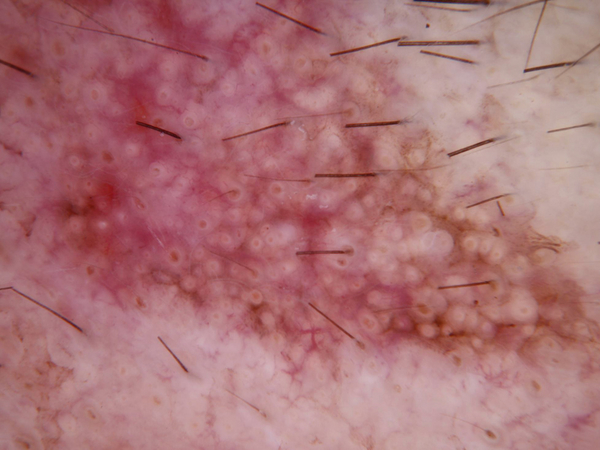

In [5]:
actinic_keratosis = list(data_dir_train.glob('actinic keratosis/*'))
PIL.Image.open(actinic_keratosis[0])

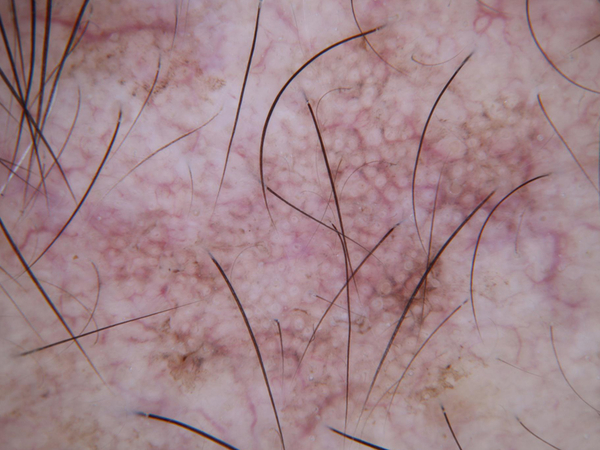

In [6]:
PIL.Image.open(str(actinic_keratosis[1]))

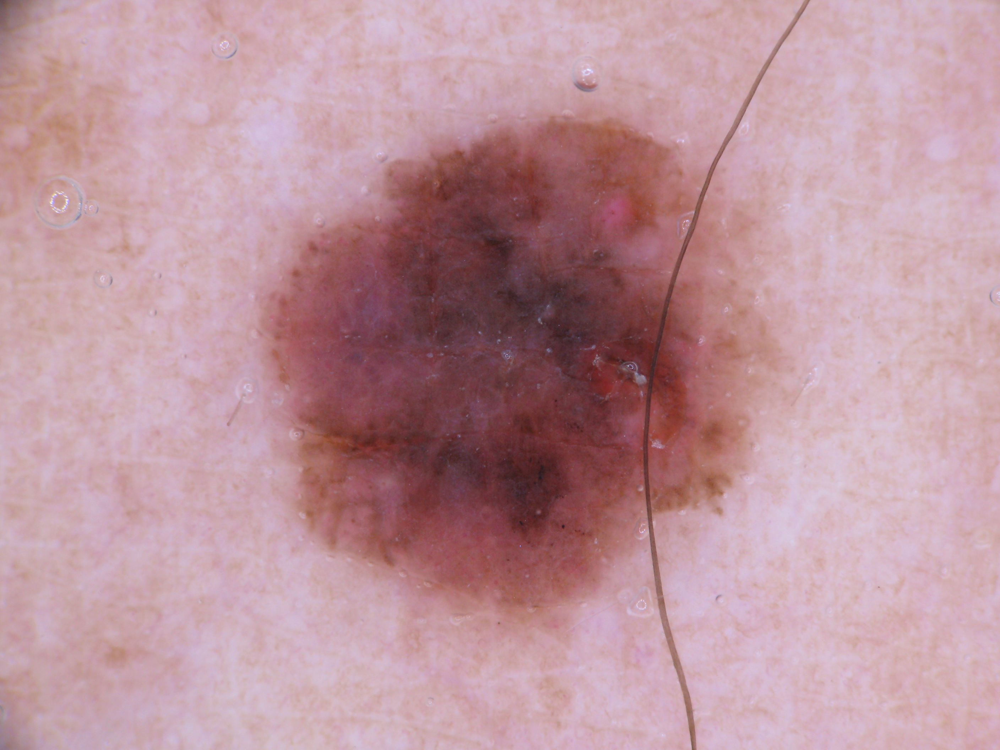

In [7]:
melanoma = list(data_dir_train.glob('melanoma/*'))
PIL.Image.open(melanoma[0])

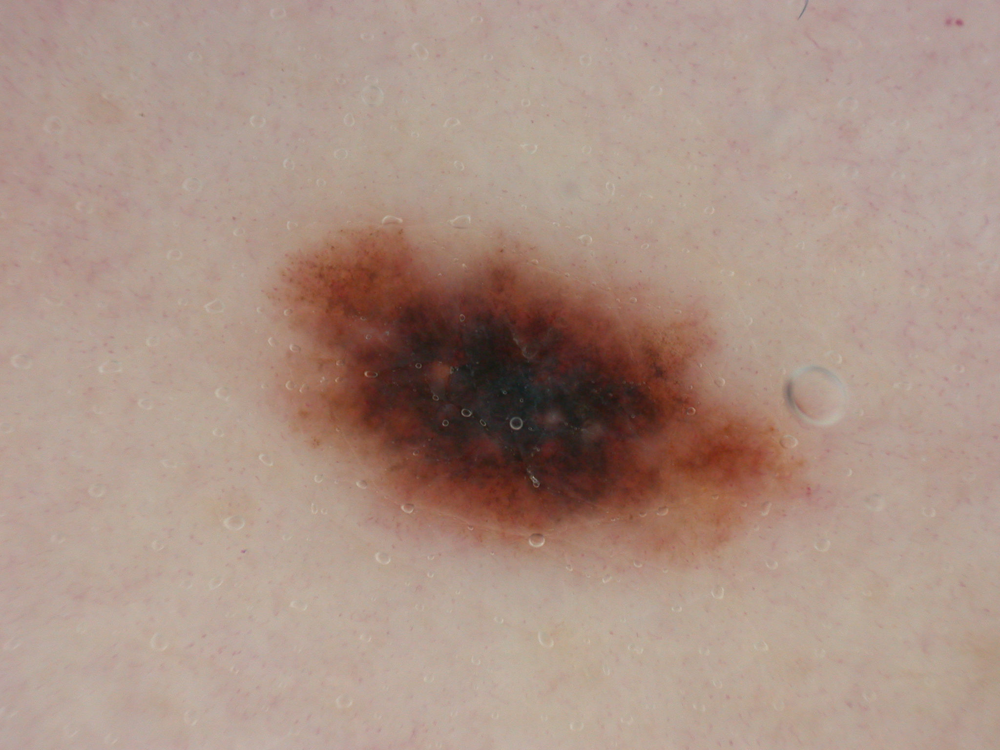

In [8]:
PIL.Image.open(melanoma[1])

### **Create a dataset**
Defined some parameters for the loader:

In [9]:
batch_size = 32
img_height = 180
img_width = 180

**Data Rescaling**

Creating train & validation dataset from the train directory with a batch size of 32. Also, making sure that we resize images to `180*180`.

In [10]:
# Train Directory 
data_dir_train="/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train"

# TRAINING DATA
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = 'training',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 2239 files belonging to 9 classes.
Using 1792 files for training.


In [11]:
# VALIDAION DATA
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = 'validation',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 2239 files belonging to 9 classes.
Using 447 files for validation.


In [12]:
# List out all the classes of skin cancer and store them in a list. 
class_names = train_ds.class_names
print(class_names)

['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


# **Dataset visualisation**
Create a code to visualize one instance of all the nine classes present in the dataset 

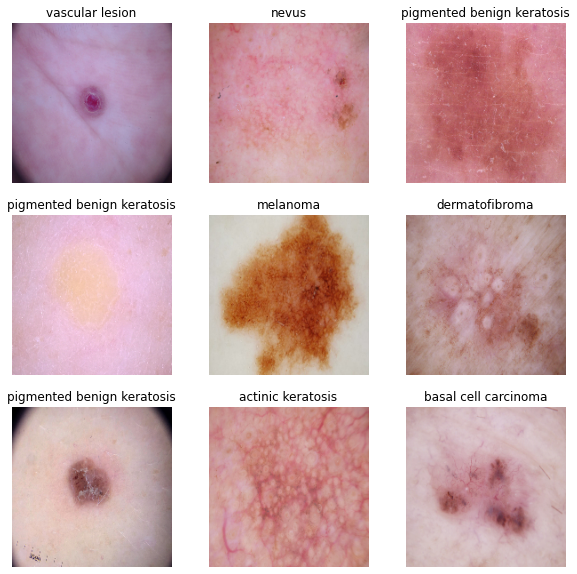

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,10))

for images,labels in train_ds.take(1):
  for i in range (9):
    ax = plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(class_names[labels[i]])
    plt.axis('off')

In [14]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


The `image_batch` is a tensor of the shape `(32, 180, 180, 3)`. This is a batch of 32 images of shape `180x180x3` (the last dimension refers to color channels RGB). The `label_batch` is a tensor of the shape `(32,)`, these are corresponding labels to the 32 images.

The image_batch is a tensor of the shape (32, 180, 180, 3). This is a batch of 32 images of shape 180x180x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images.

You can call .numpy() on the image_batch and labels_batch tensors to convert them to a numpy.ndarray.

## **Configure the dataset for performance**

Let's make sure to use buffered prefetching so we can yield data from disk without having Input/Output become blocking. These are two important methods you should use when loading data.

**`Dataset.cache()`** keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.

**`Dataset.prefetch()`** overlaps data preprocessing and model execution while training.

In [15]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## **Standardize the data**

The RGB channel values are in the **`[0, 255]`** range. This is not ideal for a neural network; in general you should seek to make your input values small. Here, you will standardize values to be in the **`[0, 1]`** range by using a Rescaling layer.

In [16]:
# Normalizing, to overcome from the problem of memory overflow / memory exaustion ( to save computational time)
normalization_layer = layers.experimental.preprocessing.Rescaling(1./255)

In [17]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixels values are now in between `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.2081701 0.8202613


# Model 1

# **Create the Model**

(using Softmax for output layer)

The model consists of three convolution blocks with a max pool layer in each of them. There's a fully connected layer with 128 units on top of it that is activated by a `Softmax` activation function. This model has not been tuned for high accuracy, the goal of this tutorial is to show a standard approach.

In [18]:
num_classes = len(class_names)

model_1_1 = Sequential([
  # Encoder part which help to extract features from your images. (Auto feature extraction part)
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  # ReLU is best as activation function for Hidden layers because it does not activate all neurons at the same time.
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(), # it help to pick the dominating features(which are more important) that we have in the dataset.
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
 
  # Classifiers, helps us to do the classification based on the fatures that are extracted. 
  layers.Flatten(),
  # Softmax is most popular activation function used for output layer when it comes to Multiclass Classification(One node per class)
  layers.Dense(128, activation='softmax'),
  layers.Dense(num_classes)
])

# **Compile the Model**

For this, We chose the `Adam` optimizer and `losses.SparseCategoricalCrossentropy` loss function. To view training and validation accuracy for each training epoch, I passed the **`metrics`** argument.


In [19]:
model_1_1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# **Model summary**

View all the layers of the network using the model's `summary` method:

In [20]:
model_1_1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_1 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 180, 180, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 90, 90, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 45, 45, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 22, 22, 32)        0

# **Train the model**

In [21]:
epochs=20
history = model_1_1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 191s 3s/step - loss: 2.1328 - accuracy: 0.1914 - val_loss: 2.1115 - val_accuracy: 0.1924
Epoch 2/20
56/56 [==============================] - 78s 1s/step - loss: 2.0989 - accuracy: 0.2009 - val_loss: 2.0870 - val_accuracy: 0.2058
Epoch 3/20
56/56 [==============================] - 76s 1s/step - loss: 2.0764 - accuracy: 0.1942 - val_loss: 2.0678 - val_accuracy: 0.2058
Epoch 4/20
56/56 [==============================] - 75s 1s/step - loss: 2.0597 - accuracy: 0.2065 - val_loss: 2.0549 - val_accuracy: 0.2058
Epoch 5/20
56/56 [==============================] - 76s 1s/step - loss: 2.0475 - accuracy: 0.2065 - val_loss: 2.0455 - val_accuracy: 0.2058
Epoch 6/20
56/56 [==============================] - 75s 1s/step - loss: 2.0384 - accuracy: 0.2065 - val_loss: 2.0384 - val_accuracy: 0.2058
Epoch 7/20
56/56 [==============================] - 76s 1s/step - loss: 2.0319 - accuracy: 0.2065 - val_loss: 2.0331 - val_accuracy: 0.2058
Epoch 8/20
56/56 [=

For 20 epochs, the accuracy i got was around 20% for validation set


## **Visualize training results**

Create plots of loss and accuracy on the training and validation sets.

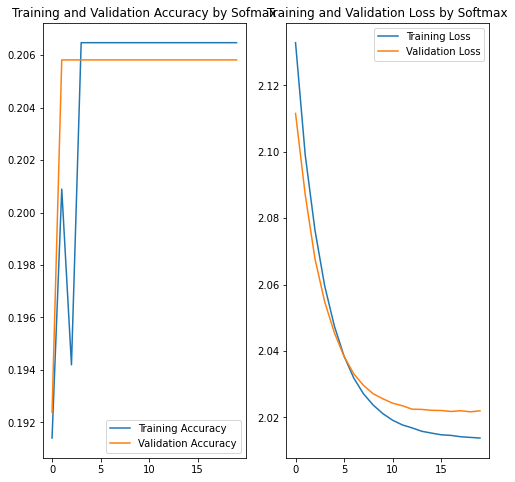

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy by Sofmax')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss by Softmax')
plt.show()

# **Basic Model (using Softmax Activation function)**
# *Accuracy ~ 20%* 
Model fits well but very low Accuracy

Here we can see that by using Softmax as avtivation function for output layer, we got correct fit but the accuracy was too low like about 20%.
we can be confident with its learning but its accuracy is not too much .

**hat's why I like to move forward with ReLU as activation function for output layer as well.**

# **Create the Model**

(using ReLU for output layer)

The model consists of three convolution blocks with a max pool layer in each of them. There's a fully connected layer with 128 units on top of it that is activated by a `ReLU` activation function. This model has not been tuned for high accuracy, the goal of this tutorial is to show a standard approach.

In [23]:
num_classes = len(class_names)

model_1_2 = Sequential([
  # Encoder part which help to extract features from your images. (Auto feature extraction part)
  layers.experimental.preprocessing.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  # ReLU is best as activation function for Hidden layers because it does not activate all neurons at the same time.
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(), # it help to pick the dominating features(which are more important) that we have in the dataset.
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
 
  # Classifiers, helps us to do the classification based on the fatures that are extracted. 
  layers.Flatten(),
  # Softmax is most popular activation function used for output layer when it comes to Multiclass Classification(One node per class)
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

# **Compile the Model**

In [24]:
model_1_2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# **Model summary**

In [25]:
model_1_2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling_2 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 180, 180, 32)      896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 45, 45, 32)        9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 22, 22, 32)       

# **Train the model**

In [26]:
epochs=20
history = model_1_2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 77s 1s/step - loss: 2.0198 - accuracy: 0.2483 - val_loss: 1.9345 - val_accuracy: 0.2103
Epoch 2/20
56/56 [==============================] - 77s 1s/step - loss: 1.7225 - accuracy: 0.3767 - val_loss: 1.5189 - val_accuracy: 0.4765
Epoch 3/20
56/56 [==============================] - 76s 1s/step - loss: 1.4746 - accuracy: 0.4682 - val_loss: 1.4241 - val_accuracy: 0.5034
Epoch 4/20
56/56 [==============================] - 76s 1s/step - loss: 1.3943 - accuracy: 0.5173 - val_loss: 1.4393 - val_accuracy: 0.5257
Epoch 5/20
56/56 [==============================] - 76s 1s/step - loss: 1.3417 - accuracy: 0.5346 - val_loss: 1.3771 - val_accuracy: 0.5280
Epoch 6/20
56/56 [==============================] - 77s 1s/step - loss: 1.2460 - accuracy: 0.5513 - val_loss: 1.3927 - val_accuracy: 0.5414
Epoch 7/20
56/56 [==============================] - 77s 1s/step - loss: 1.1826 - accuracy: 0.5787 - val_loss: 1.3730 - val_accuracy: 0.5011
Epoch 8/20
56/56 [==

# **Visualize training results**

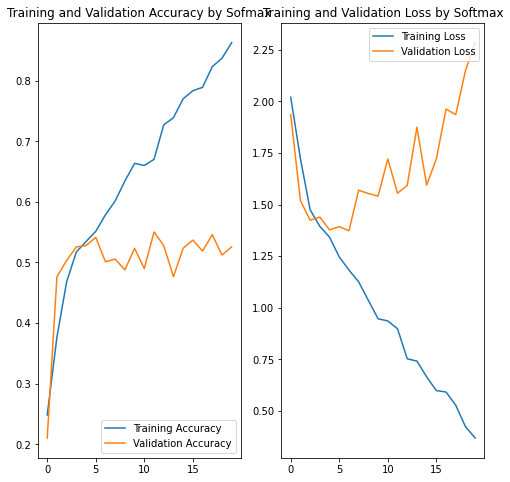

In [27]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy by Sofmax')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss by Softmax')
plt.show()

### **Write your findings after the model fit, see if there is an evidence of model overfit or underfit**

As you can see from the plots, training accuracy and validation accuracy are off by large margin and the model has achieved only around 50% accuracy on the validation set.

As the training accuracy and validation accuracy are off by large margin, so we have the evidence for model overfit.

# **Basic Model (using ReLU Activation function)**
# *Accuracy ~ 50%* 
Model's Accuracy was well but shows signs of overfitting

# **Overfitting**

In the plots above, the training accuracy is increasing linearly over time, whereas validation accuracy stalls around 50% in the training process. Also, the difference in accuracy between training and validation accuracy is noticeable—a sign of overfitting.

When there are a small number of training examples, the model sometimes learns from noises or unwanted details from training examples—to an extent that it negatively impacts the performance of the model on new examples. This phenomenon is known as overfitting. It means that the model will have a difficult time generalizing on a new dataset.

There are multiple ways to fight overfitting in the training process. In this tutorial, you'll use data augmentation and add Dropout to your model.

# Model 2

# **Data augmentation**

Overfitting generally occurs when there are a small number of training examples. Data augmentation takes the approach of generating additional training data from your existing examples by augmenting them using random transformations that yield believable-looking images. This helps expose the model to more aspects of the data and generalize better.

You will implement data augmentation using the layers from tf.keras.layers.experimental.preprocessing. These can be included inside your model like other layers, and run on the GPU.

# **Augmentation Step**

(on whole data)

In [28]:
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical", 
                                                 input_shape=(img_height, 
                                                              img_width,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
  ]
)

Let's visualize what a few augmented examples look like by applying data augmentation to the same image several times:

# **Augmented Data**

I keep in mind that giving more data to the model is of no use if it is not useful. that's why i didnt't used the random zoom because it would be a waste for the model as it won't learn about the problem statement.

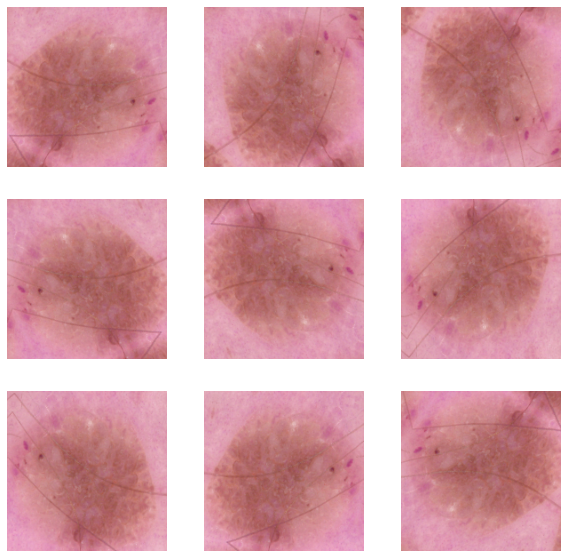

In [29]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

we used data augmentation to train a model.

# **Create the Model**

(without Dropout)

In [30]:
model_2_1 = Sequential([
  data_augmentation,
  layers.experimental.preprocessing.Rescaling(1./255),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

# **Compile the Model**

In [31]:
model_2_1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# **Model Summary**

In [32]:
model_2_1.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 180, 180, 3)       0         
_________________________________________________________________
rescaling_3 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 180, 180, 32)      896       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 45, 45, 32)       

# **Train the Model**

In [33]:
epochs = 20
history = model_2_1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 84s 1s/step - loss: 2.0889 - accuracy: 0.1858 - val_loss: 2.0073 - val_accuracy: 0.2931
Epoch 2/20
56/56 [==============================] - 82s 1s/step - loss: 1.9089 - accuracy: 0.3064 - val_loss: 1.6772 - val_accuracy: 0.3960
Epoch 3/20
56/56 [==============================] - 82s 1s/step - loss: 1.6311 - accuracy: 0.4208 - val_loss: 1.4821 - val_accuracy: 0.5168
Epoch 4/20
56/56 [==============================] - 82s 1s/step - loss: 1.5327 - accuracy: 0.4682 - val_loss: 1.4668 - val_accuracy: 0.4989
Epoch 5/20
56/56 [==============================] - 82s 1s/step - loss: 1.4234 - accuracy: 0.4922 - val_loss: 1.4692 - val_accuracy: 0.4810
Epoch 6/20
56/56 [==============================] - 82s 1s/step - loss: 1.3784 - accuracy: 0.5078 - val_loss: 1.3790 - val_accuracy: 0.5257
Epoch 7/20
56/56 [==============================] - 82s 1s/step - loss: 1.3425 - accuracy: 0.5223 - val_loss: 1.4431 - val_accuracy: 0.4810
Epoch 8/20
56/56 [==

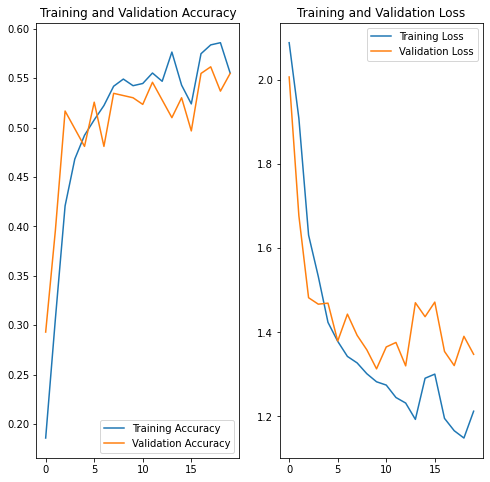

In [34]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# **Data Augmentation Technique on whole data without Drop-out**
# *Accuracy ~ 55%* 
Model shows better accuracy with better model fitting than basic model.

# **Using Dropout**

Another technique to reduce overfitting is to introduce Dropout to the network, a form of regularization.

When you apply Dropout to a layer it randomly drops out (by setting the activation to zero) a number of output units from the layer during the training process. Dropout takes a fractional number as its input value, in the form such as 0.1, 0.2, 0.4, etc. This means dropping out 10%, 20% or 40% of the output units randomly from the applied layer.

Let's create a new neural network using layers.Dropout, then train it using augmented images.

In [35]:
model_2_2 = Sequential([
  data_augmentation,
  layers.experimental.preprocessing.Rescaling(1./255),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

# **Compiling the model**

In [36]:
model_2_2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [37]:
model_2_2.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 180, 180, 3)       0         
_________________________________________________________________
rescaling_4 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 180, 180, 32)      896       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 90, 90, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 45, 45, 32)       

## **Training the model**

In [38]:
epochs = 20
history = model_2_2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 84s 1s/step - loss: 2.0657 - accuracy: 0.2254 - val_loss: 1.9699 - val_accuracy: 0.2975
Epoch 2/20
56/56 [==============================] - 84s 1s/step - loss: 1.7643 - accuracy: 0.3705 - val_loss: 1.6096 - val_accuracy: 0.4183
Epoch 3/20
56/56 [==============================] - 83s 1s/step - loss: 1.5562 - accuracy: 0.4632 - val_loss: 1.4984 - val_accuracy: 0.5056
Epoch 4/20
56/56 [==============================] - 83s 1s/step - loss: 1.4657 - accuracy: 0.4833 - val_loss: 1.4509 - val_accuracy: 0.4944
Epoch 5/20
56/56 [==============================] - 83s 1s/step - loss: 1.4396 - accuracy: 0.5084 - val_loss: 1.4221 - val_accuracy: 0.5168
Epoch 6/20
56/56 [==============================] - 83s 1s/step - loss: 1.4061 - accuracy: 0.5128 - val_loss: 1.5795 - val_accuracy: 0.4765
Epoch 7/20
56/56 [==============================] - 83s 1s/step - loss: 1.3465 - accuracy: 0.5229 - val_loss: 1.4189 - val_accuracy: 0.5213
Epoch 8/20
56/56 [==

# **Visualize training results**

After applying data augmentation and Dropout, there is less overfitting than before, and training and validation accuracy are closer aligned.

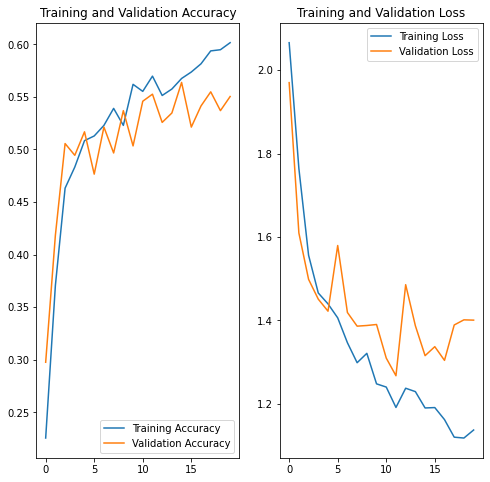

In [39]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# **Data Augmentation Technique on whole data with Drop-out**
# *Accuracy ~ 54%* 
Model shows better accuracy than basic model but model fitting was bad than Augmented model without dropout.

### **Write your findings after the model fit, see if there is an evidence of model overfit or underfit. Do you think there is some improvement now as compared to the previous model run?**

Yes, after applying Data Augmentation technique i saw slight improvement without using dropout layer as model fit was also better as compare to model with dropout layer.



# Model 3

# **Controlled Augmentation on data**

As data has class imbalance so, we can  say that by overcoming through that we can get better accuracy. as we dont want to over power the current dominating class. Rather than that we want to give equal waitage to every class so that model accuracy can enhance more.

In [40]:
from glob import glob
path_list = [x for x in glob(os.path.join(data_dir_train, '*', '*.jpg'))]
lesion_list = [os.path.basename(os.path.dirname(y)) for y in glob(os.path.join(data_dir_train, '*', '*.jpg'))]
len(path_list)

2239

In [41]:
dataframe_dict_original = dict(zip(path_list, lesion_list))
original_df = pd.DataFrame(list(dataframe_dict_original.items()),columns = ['Path','Label'])
original_df

,Path,Label
0,/content/gdrive/MyDrive/Python Notebooks /CNN ...,actinic keratosis
1,/content/gdrive/MyDrive/Python Notebooks /CNN ...,actinic keratosis
2,/content/gdrive/MyDrive/Python Notebooks /CNN ...,actinic keratosis
3,/content/gdrive/MyDrive/Python Notebooks /CNN ...,actinic keratosis
4,/content/gdrive/MyDrive/Python Notebooks /CNN ...,actinic keratosis
...,...,...
2234,/content/gdrive/MyDrive/Python Notebooks /CNN ...,vascular lesion
2235,/content/gdrive/MyDrive/Python Notebooks /CNN ...,vascular lesion
2236,/content/gdrive/MyDrive/Python Notebooks /CNN ...,vascular lesion
2237,/content/gdrive/MyDrive/Python Notebooks /CNN ...,vascular lesion


### **Finding the distribution of classes in the training dataset.**

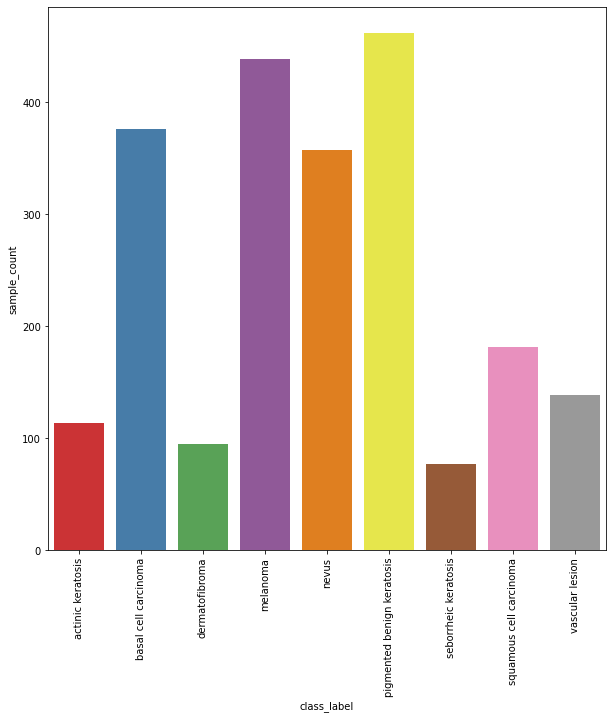

,sample_count,class_label
0,114,actinic keratosis
1,376,basal cell carcinoma
2,95,dermatofibroma
3,438,melanoma
4,357,nevus
5,462,pigmented benign keratosis
6,77,seborrheic keratosis
7,181,squamous cell carcinoma
8,139,vascular lesion


In [42]:
import seaborn as sns
sample_count = []
class_label = []
for i in class_names:
    samplelist = os.listdir(str(data_dir_train) + "/" + i)
    sample_count.append(len(samplelist))
    class_label.append(i)

df = pd.DataFrame({'sample_count': sample_count, 'class_label':class_label})

plt.figure(figsize=(10, 10))
sns.barplot(x='class_label', y='sample_count',  palette = "Set1", data=df)
plt.xticks(rotation=90)
plt.show()

df

## **Write your findings here:**

### **Which class has the least number of samples?**

seborrheic keratosis have least number of samples of about 77.

### **Which classes dominate the data in terms proportionate number of samples?**

pigmented benign keratosis is  the dominating class dominating the data which have image sample size of 462.

## **Rectify the class imbalance**

Context: You can use a python package known as Augmentor (https://augmentor.readthedocs.io/en/master/) to add more samples across all classes so that none of the classes have very few samples.¶

# **Installing Augmentor**

In [43]:
!pip install Augmentor

To use `Augmentor`, the following general procedure is followed:

1. Instantiate a `Pipeline` object pointing to a directory containing your initial image data set.<br>
2. Define a number of operations to perform on this data set using your `Pipeline` object.<br>
3. Execute these operations by calling the `Pipeline’s` `sample()` method.


# **Making Data using Augmentor**

In [44]:
path_to_training_dataset= "/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/"

import Augmentor
for i in class_names:
    p = Augmentor.Pipeline(path_to_training_dataset + i)
    p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
    p.sample(500) ## We are adding 500 samples per class to make sure that none of the classes are sparse.

Initialised with 114 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/actinic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7FB2BC7331D0>: 100%|██████████| 500/500 [00:24<00:00, 20.57 Samples/s]


Initialised with 376 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/basal cell carcinoma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7FB2CD8D2C50>: 100%|██████████| 500/500 [00:27<00:00, 18.41 Samples/s]


Initialised with 95 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/dermatofibroma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7FB2C82F3B90>: 100%|██████████| 500/500 [00:24<00:00, 20.77 Samples/s]


Initialised with 438 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/melanoma/output.

Processing <PIL.Image.Image image mode=RGB size=767x576 at 0x7FB2C90C6290>: 100%|██████████| 500/500 [01:38<00:00,  5.08 Samples/s]


Initialised with 357 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/nevus/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7FB2C904C3D0>: 100%|██████████| 500/500 [01:38<00:00,  5.09 Samples/s]


Initialised with 462 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/pigmented benign keratosis/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7FB2CD6C3DD0>: 100%|██████████| 500/500 [00:23<00:00, 20.89 Samples/s]


Initialised with 77 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/seborrheic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7FB2C90ABAD0>: 100%|██████████| 500/500 [00:50<00:00,  9.83 Samples/s]


Initialised with 181 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/squamous cell carcinoma/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7FB2CD857710>: 100%|██████████| 500/500 [00:24<00:00, 20.68 Samples/s]


Initialised with 139 image(s) found.
Output directory set to /content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/vascular lesion/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7FB2BC720050>: 100%|██████████| 500/500 [00:24<00:00, 20.54 Samples/s]


## **Taking Count on Images**

In [50]:
data_dir_train = pathlib.Path("/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train")
image_count_train = len(list(data_dir_train.glob('*/output/*.jpg')))
print(image_count_train)

4500


### Looking at the distribution of augmented data after adding new images to the original training data.

In [51]:
import glob
path_list_new = [x for x in glob.glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
path_list_new

['/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/actinic keratosis/output/actinic keratosis_original_ISIC_0030242.jpg_ab90e670-784e-46c5-9819-871049b47a67.jpg',
 '/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/actinic keratosis/output/actinic keratosis_original_ISIC_0031430.jpg_ccd0512a-61be-441d-9420-0ebc298a60d8.jpg',
 '/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/actinic keratosis/output/actinic keratosis_original_ISIC_0031381.jpg_3b28c701-bb1d-47be-9009-3e98b7ec8cd0.jpg',
 '/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train/actinic keratosis/output/actinic keratosis_original_ISIC_0026848.jpg_9d63b493-8106-4a15-9377-4fee1d76e2c7.jpg',
 '/content/gdrive/MyDrive/Python Notebooks /

In [54]:
lesion_list_new = [os.path.basename(os.path.dirname(os.path.dirname(y))) for y in glob.glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
lesion_list_new

['actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic 

In [55]:
dataframe_dict_new = dict(zip(path_list_new, lesion_list_new))

In [56]:
df2 = pd.DataFrame(list(dataframe_dict_new.items()),columns = ['Path','Label'])
new_df = original_df.append(df2)

In [57]:
new_df['Label'].value_counts()

pigmented benign keratosis    962
melanoma                      938
basal cell carcinoma          876
nevus                         857
squamous cell carcinoma       681
vascular lesion               639
actinic keratosis             614
dermatofibroma                595
seborrheic keratosis          577
Name: Label, dtype: int64

Now data looks much better than before and we can say that we rectified class imbalance to an instance which can help us to attain better accuracy with the model.

`pigmented benign keratosis` class is still dominating but the `seborrheic keratosis class` which had least number of samples, have sufficient amount of samples to gain accuracy on prediction.

### **Defining Parameters**

In [58]:
# Defining batch size and image height and width
batch_size = 32
img_height = 180
img_width = 180

### **Create a training dataset**

In [59]:
# Creating train dataset
data_dir_train="/content/gdrive/MyDrive/Python Notebooks /CNN Assignment/Skin cancer ISIC The International Skin Imaging Collaboration/Train"
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = 'training', 
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 6739 files belonging to 9 classes.
Using 5392 files for training.


### **Create a validation dataset**

In [60]:
# Creating validation dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset ='validation',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 6739 files belonging to 9 classes.
Using 1347 files for validation.


### **Create your model (make sure to include normalization)**

In [61]:
# Normalizing, to overcome from the problem of memory overflow / memory exaustion ( to save computational time)
normalization_layer_new = layers.experimental.preprocessing.Rescaling(1./255)

In [62]:
normalized_ds_new = train_ds.map(lambda x, y: (normalization_layer_new(x), y))
image_batch, labels_batch = next(iter(normalized_ds_new))
first_image = image_batch[0]
# Notice the pixels values are now in between `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.24836604 0.9978758


In [63]:
model_3 = Sequential([
  data_augmentation,
  layers.experimental.preprocessing.Rescaling(1./255),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

### **Compiling model**

In [64]:
model_3.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])


In [67]:
model_3.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_2 (Sequential)    (None, 180, 180, 3)       0         
_________________________________________________________________
rescaling_6 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 180, 180, 32)      896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 90, 90, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 45, 45, 32)       

### **Train your model**

In [66]:
epochs = 30
history = model_3.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/30
169/169 [==============================] - 282s 2s/step - loss: 1.8347 - accuracy: 0.3112 - val_loss: 1.5972 - val_accuracy: 0.4105
Epoch 2/30
169/169 [==============================] - 279s 2s/step - loss: 1.5128 - accuracy: 0.4254 - val_loss: 1.4248 - val_accuracy: 0.4647
Epoch 3/30
169/169 [==============================] - 278s 2s/step - loss: 1.4047 - accuracy: 0.4703 - val_loss: 1.3746 - val_accuracy: 0.4996
Epoch 4/30
169/169 [==============================] - 278s 2s/step - loss: 1.3567 - accuracy: 0.4872 - val_loss: 1.3400 - val_accuracy: 0.5019
Epoch 5/30
169/169 [==============================] - 279s 2s/step - loss: 1.2902 - accuracy: 0.5076 - val_loss: 1.2090 - val_accuracy: 0.5434
Epoch 6/30
169/169 [==============================] - 277s 2s/step - loss: 1.2598 - accuracy: 0.5171 - val_loss: 1.2600 - val_accuracy: 0.5071
Epoch 7/30
169/169 [==============================] - 278s 2s/step - loss: 1.2028 - accuracy: 0.5432 - val_loss: 1.1776 - val_accuracy: 0.5367

### **Visualize the model results**

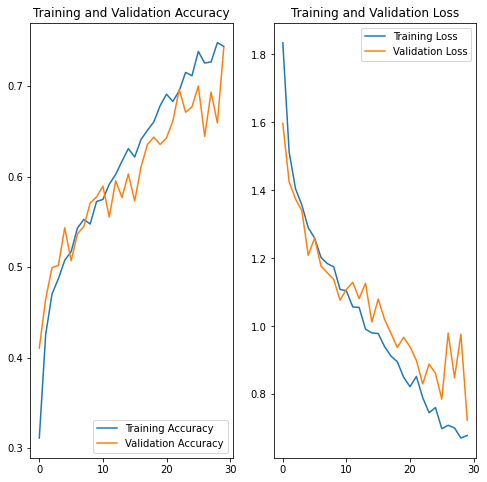

In [68]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# **Data Augmentation Technique on whole data with Drop-out**
# *Accuracy ~ 74%* 
Model shows better accuracy than the last Augmented model, as both of the graphs (Accuracy and loss graphs are converging) while the accuracy keep on increasing. 
I used 30 epochs to make this model.

### **Analyze your results here. Did you get rid of underfitting/overfitting? Did class rebalance help?**

In [69]:
#Checking the maximum accuracy of training and validation
print("Maximum accuracy of training data : ", round(max(acc)*100,4))
print("Maximum accuracy of validation data : ", round(max(val_acc)*100,4))

Maximum accuracy of training data :  74.796
Maximum accuracy of validation data :  74.2391


### **Yes, After rebalance we could overcome overfitting and accuracy has also improved a lot.**

# **Summary**

1) Basic Model(using Softmax), Accuracy - 20 %

In [70]:
import pandas as pd
 
# initialise data of lists.
data = {'Model Name':['Basic Model (with Softmax)', 'Basic Model (with ReLU)', 'Augmented on whole data without dropout',
                      'Augmented on whole data with dropout', "Controlled Augmentation while rectifying class imbalance"],
        'Accuracy (in %)':[20, 50, 55, 54, 74]}
 
# Create DataFrame
df = pd.DataFrame(data)
 
# Print the output.
df

,Model Name,Accuracy (in %)
0,Basic Model (with Softmax),20
1,Basic Model (with ReLU),50
2,Augmented on whole data without dropout,55
3,Augmented on whole data with dropout,54
4,Controlled Augmentation while rectifying class...,74


Controlled Augmentation while rectifying class imbalance model shows best accuracy with better confidence. As we saw that, the graps for accuracy and loss were convering. and maybe i would get better accuracy if i made it for 50 epochs instead of 30 epochs(for current model).